In [17]:
import pandas as pd
import numpy as np
import os
import sys

# Table of contents:
* [Links](#links)
* [Data Exploration](#data_exploration)
* [Build Estimator](#build_estimator)
* [Training](#training)
* [Validation](#validation)
* [Prediction](#prediction)

## Links <a class="anchor" id="links"></a>

#https://www.kaggle.com/jeffd23/the-nature-conservancy-fisheries-monitoring/deep-learning-in-the-deep-blue-lb-1-279
#https://www.kaggle.com/narae78/the-nature-conservancy-fisheries-monitoring/fish-detection
#https://www.kaggle.com/andrelopes1705/the-nature-conservancy-fisheries-monitoring/lasagne-based-of-zfturbo-keras-code/code
#https://www.youtube.com/watch?v=qIUh3CEeTqg
#https://medium.com/@ageitgey/machine-learning-is-fun-part-3-deep-learning-and-convolutional-neural-networks-f40359318721#.f8uh9jgiu
#http://blog.xebia.fr/2017/03/01/tensorflow-deep-learning-episode-1-introduction/
#http://cs231n.github.io/neural-networks-3/

## Data Exploration<a class="anchor" id="data_exploration"></a>

In [18]:
TRAIN_PATH = './data/train'

In [19]:
def listFiles():
    map_dir_files = {}
    for d in os.listdir(TRAIN_PATH):
        d = os.path.join(TRAIN_PATH,d)
        if os.path.isdir(d):
            files = os.listdir(d)
            map_dir_files [d] = files
            sys.stderr.writelines("Nb files for %s: %d \n" % (d, len(files)))
    return map_dir_files

In [20]:
%time map_dir_files = listFiles()

Wall time: 402 ms


Nb files for ./data/train\ALB: 1719 
Nb files for ./data/train\BET: 200 
Nb files for ./data/train\DOL: 117 
Nb files for ./data/train\LAG: 67 
Nb files for ./data/train\NoF: 465 
Nb files for ./data/train\OTHER: 299 
Nb files for ./data/train\SHARK: 176 
Nb files for ./data/train\YFT: 734 


In [21]:
from PIL import Image
import matplotlib.pyplot as plt
import random
%matplotlib inline

In [22]:
def plot_graph(fish, nbfiles, nbcolumns, is_random = True):
    files = os.listdir(fish)
    nblines = int(nbfiles / nbcolumns)
    fig, ax = plt.subplots(nrows=nblines, ncols=nbcolumns, figsize=(15,15))
    ax = ax.flatten()
   
    for i in range(0,nbfiles):
        f = random.choice(files) if is_random else files[i]
        img = Image.open(os.path.join(fish,f))
        ax[i].imshow(img)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        ax[i].set_title("%s h:%s w:%s" % (f, img.height,img.width))
    plt.tight_layout()

Wall time: 7.88 s


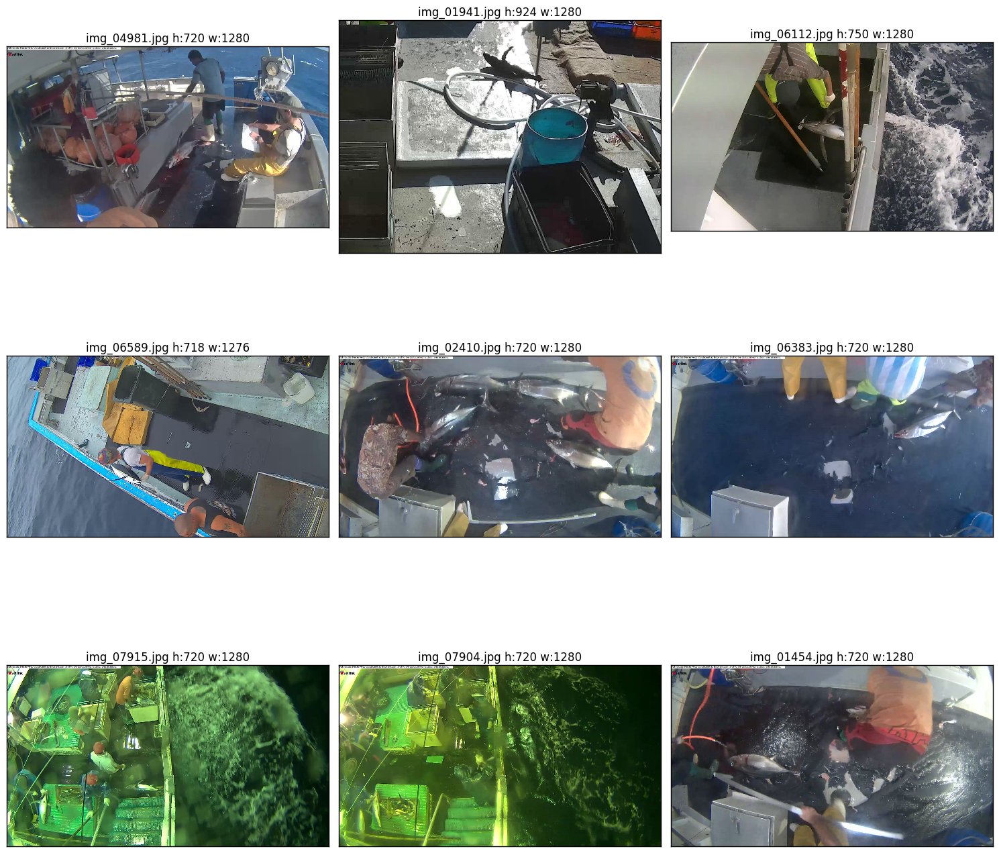

In [23]:
%time plot_graph(os.path.join(TRAIN_PATH,'ALB'), 9, 3 )

Wall time: 4.34 s


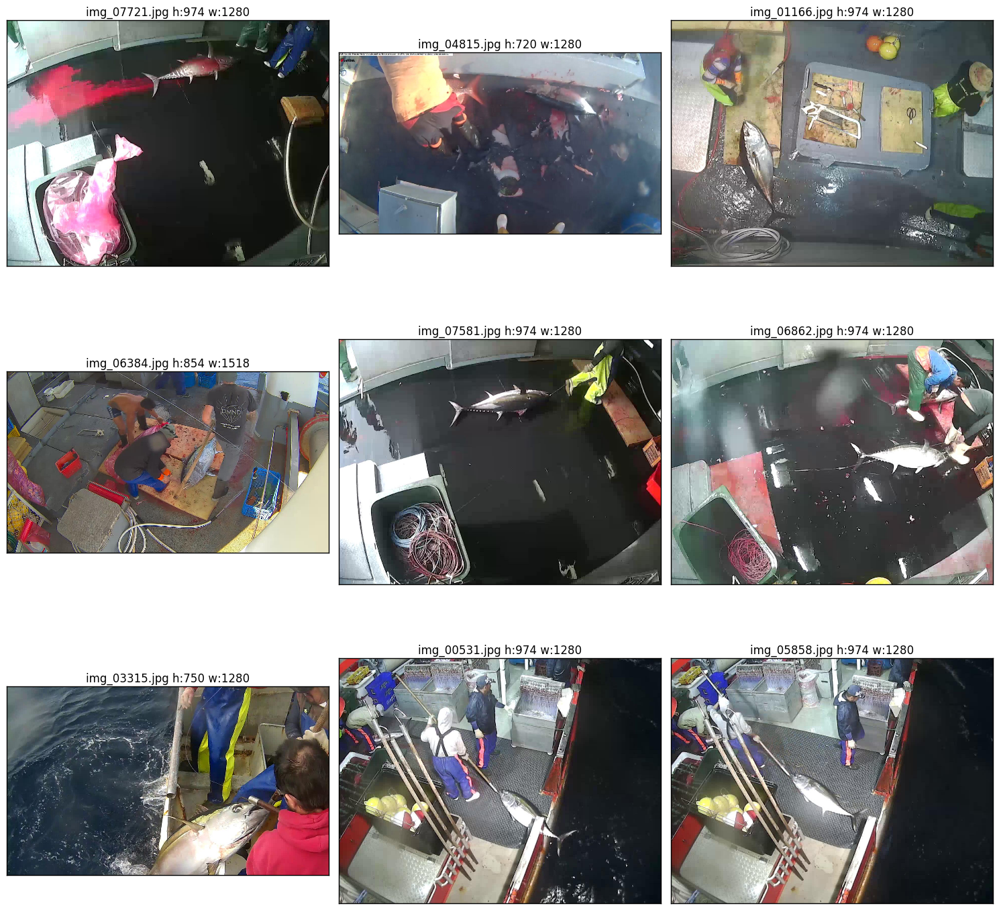

In [24]:
%time plot_graph(os.path.join(TRAIN_PATH,'BET'), 9, 3 )

Wall time: 3.75 s


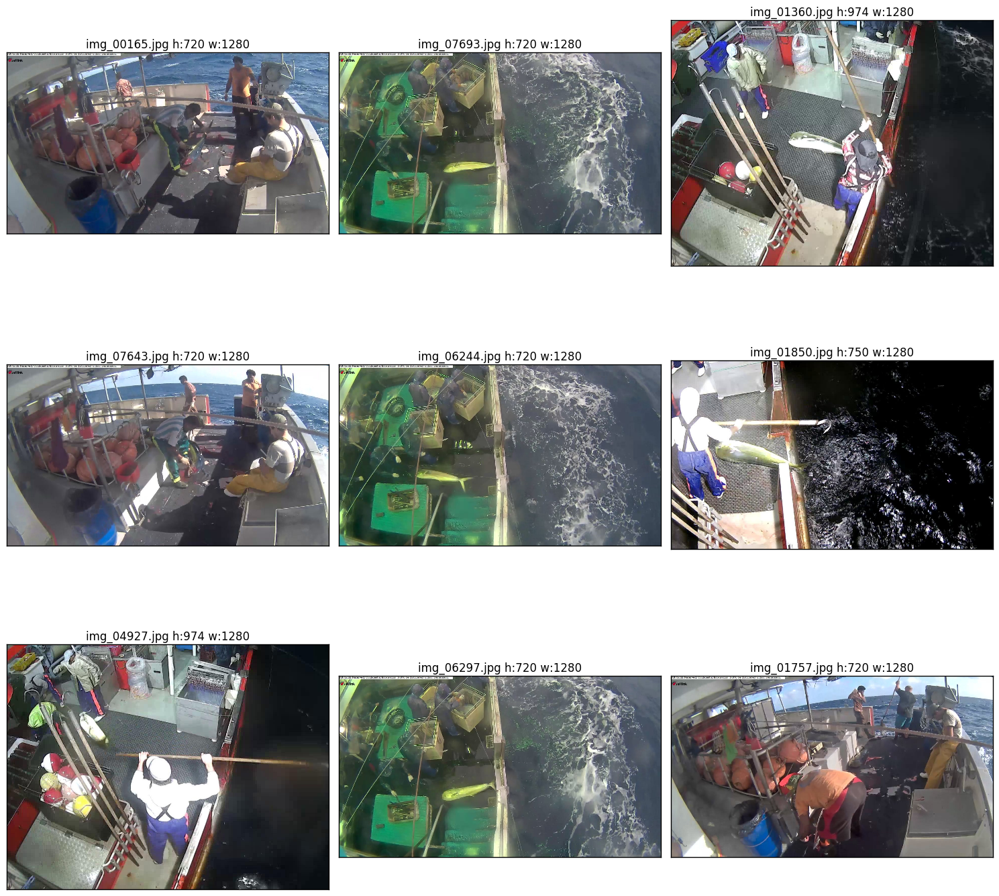

In [25]:
%time plot_graph(os.path.join(TRAIN_PATH,'DOL'), 9, 3 )

Wall time: 4.27 s


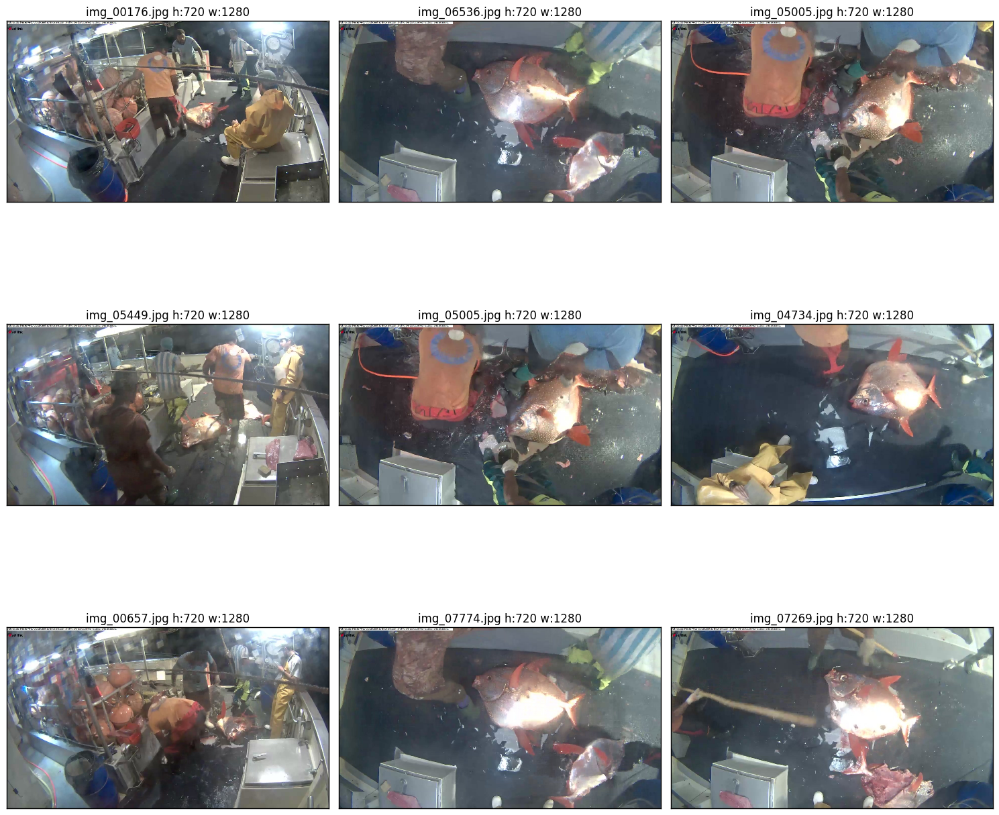

In [26]:
%time plot_graph(os.path.join(TRAIN_PATH,'LAG'), 9, 3 )

Wall time: 2.68 s


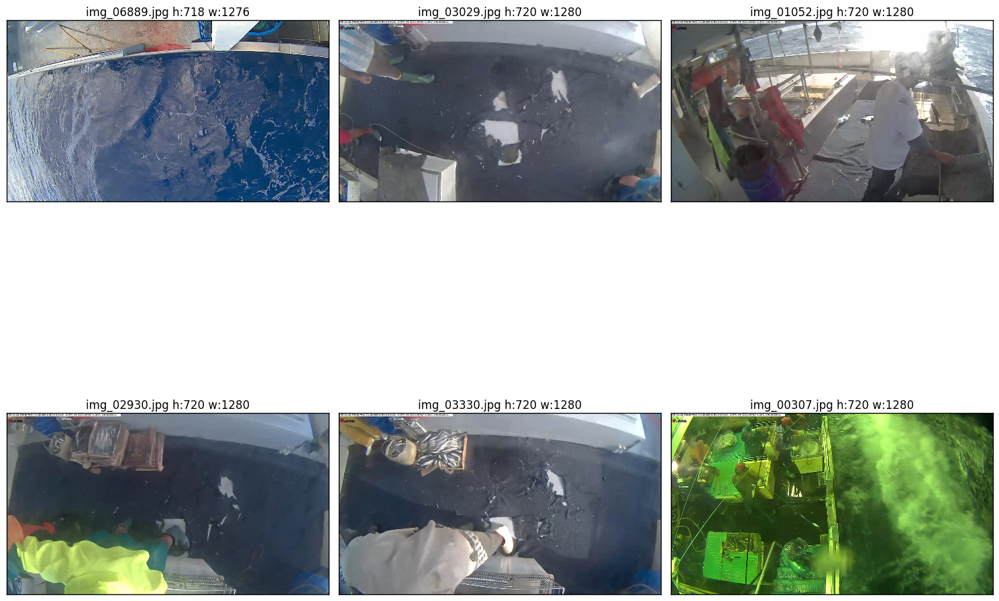

In [27]:
%time plot_graph(os.path.join(TRAIN_PATH,'Nof'),6, 3 )

In [28]:
def get_all_files(root_dir):
    list_files = []
    for root, subdirs, files in os.walk(root_dir):            
            list_files.extend([os.path.join(root,f) for f in files])
    for f in list_files:
        if os.path.splitext(f)[-1].lower() != ".jpg":
            list_files.remove(f)
    return list_files

In [29]:
%time list_files = get_all_files(TRAIN_PATH)
list_files[:10]

Wall time: 172 ms


['./data/train\\ALB\\img_00003.jpg',
 './data/train\\ALB\\img_00010.jpg',
 './data/train\\ALB\\img_00012.jpg',
 './data/train\\ALB\\img_00015.jpg',
 './data/train\\ALB\\img_00019.jpg',
 './data/train\\ALB\\img_00020.jpg',
 './data/train\\ALB\\img_00029.jpg',
 './data/train\\ALB\\img_00032.jpg',
 './data/train\\ALB\\img_00037.jpg',
 './data/train\\ALB\\img_00038.jpg']

In [30]:
np_files = np.array(list_files)
%time shapes = [Image.open(f).size for f in list_files]

Wall time: 2min 28s


In [31]:
import pandas as pd

In [32]:
pd.Series(shapes).value_counts()

(1280, 720)    2174
(1280, 750)     598
(1280, 974)     395
(1276, 718)     220
(1192, 670)     198
(1280, 924)      60
(1518, 854)      39
(1732, 974)      35
(1334, 750)      31
(1244, 700)      27
dtype: int64

In [33]:
#conda install -c https://conda.binstar.org/menpo opencv3
import cv2
print (cv2.__version__)
print (cv2.__file__)

3.1.0
C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\cv2.cp35-win_amd64.pyd


In [34]:
N_COLS = 128
N_ROWS = 128

In [35]:
def build_X_y(files, COLS = 160, ROWS = 90,  CHANNELS =3):
    X = np.ndarray((len(files), ROWS, COLS, CHANNELS), dtype = np.float32)
    y = []
    
    for i,im in enumerate(files):
        fish = str.split(os.path.dirname(im), os.sep)[-1]
        if i%500 == 0:
            sys.stderr.writelines("file:%s y:%s  %d/%d \n" % (im.title(), fish, i ,len(files)))
            sys.stderr.flush()
        
        im = cv2.imread(im,cv2.IMREAD_COLOR)
        X[i] = cv2.resize(im, (COLS,ROWS), interpolation=cv2.INTER_CUBIC)
        y.append(fish)
    return X,y

In [36]:
%time X,y = build_X_y(list_files, COLS = N_COLS, ROWS = N_ROWS)

file:./Data/Train\Alb\Img_00003.Jpg y:ALB  0/3777 
file:./Data/Train\Alb\Img_02263.Jpg y:ALB  500/3777 
file:./Data/Train\Alb\Img_04683.Jpg y:ALB  1000/3777 
file:./Data/Train\Alb\Img_07078.Jpg y:ALB  1500/3777 
file:./Data/Train\Dol\Img_05446.Jpg y:DOL  2000/3777 
file:./Data/Train\Nof\Img_06610.Jpg y:NoF  2500/3777 
file:./Data/Train\Shark\Img_06082.Jpg y:SHARK  3000/3777 
file:./Data/Train\Yft\Img_04918.Jpg y:YFT  3500/3777 


Wall time: 8min 21s


In [37]:
FOLDER_RESIZED = 'RESIZED'
if not os.path.exists(FOLDER_RESIZED):
    os.mkdir(FOLDER_RESIZED)

In [38]:
for i in range(12):
    im = random.choice(X)
    im_name = os.path.join(FOLDER_RESIZED,"im_%s.jpg" % i)
    %time cv2.imwrite(im_name, im)

Wall time: 738 ms
Wall time: 31.2 ms
Wall time: 46.9 ms
Wall time: 31.2 ms
Wall time: 31.3 ms
Wall time: 15.6 ms
Wall time: 53.7 ms
Wall time: 31.7 ms
Wall time: 31.2 ms
Wall time: 31.2 ms
Wall time: 46.9 ms
Wall time: 31.3 ms


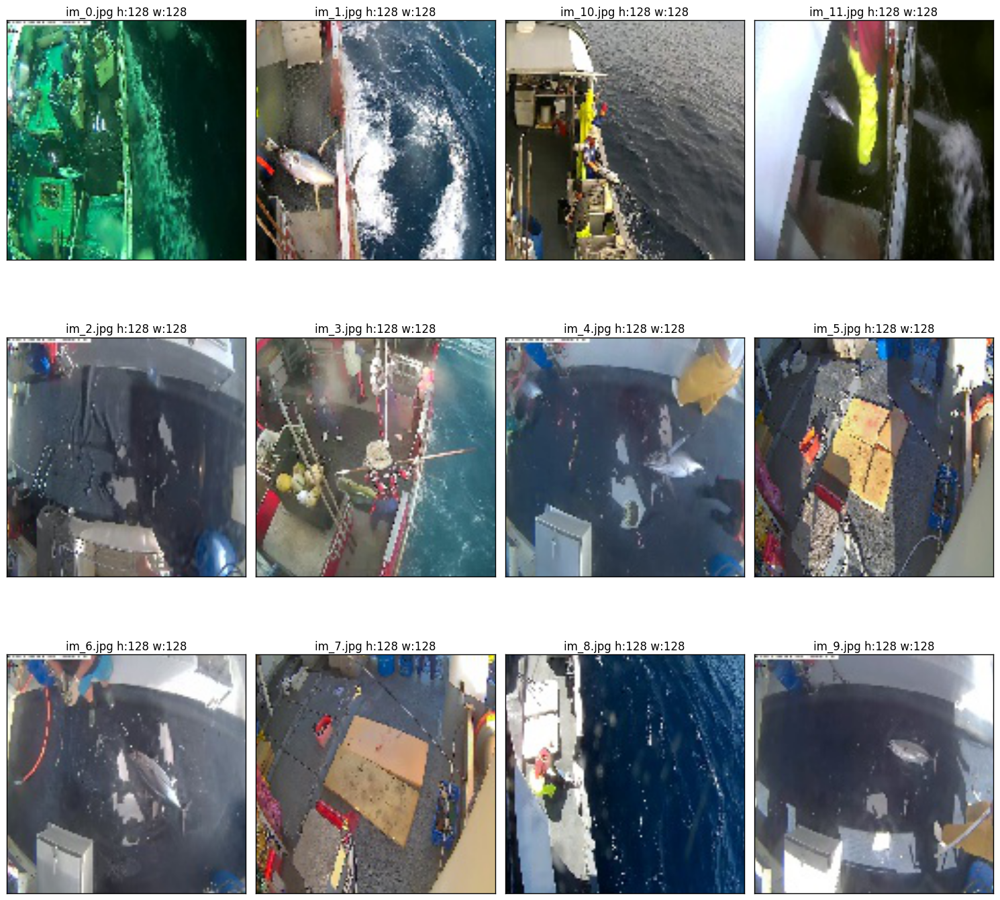

In [39]:
plot_graph(FOLDER_RESIZED,12,4,is_random = False)

In [40]:
from sklearn.cross_validation import train_test_split

In [41]:
%time X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42, stratify=y)

Wall time: 1.56 s


In [42]:
X_train = X_train / 255
X_test = X_test / 255

In [43]:
sys.stderr.writelines('Nb values: %d \n' % len(y_train))

alb_ratio_train = np.count_nonzero(np.asarray(y_train) == 'ALB') / len(y_train)
sys.stderr.writelines('Ratio ALB in train: %f \n' % alb_ratio_train)

alb_ratio_test = np.count_nonzero(np.asarray(y_test) == 'ALB') / len(y_test)
sys.stderr.writelines('Ratio ALB in test: %f \n' % alb_ratio_test)

dol_ratio_train = np.count_nonzero(np.asarray(y_train) == 'DOL') / len(y_train)
sys.stderr.writelines('Ratio DOL in train: %f \n' % dol_ratio_train)

dol_ratio_test = np.count_nonzero(np.asarray(y_test) == 'DOL') / len(y_test)
sys.stderr.writelines('Ratio DOL in test: %f \n' % dol_ratio_test)

Nb values: 2643 
Ratio ALB in train: 0.455165 
Ratio ALB in test: 0.455026 
Ratio DOL in train: 0.031025 
Ratio DOL in test: 0.030864 


In [44]:
shapes = [x.shape for x in X]
pd.Series(shapes).value_counts()

(128, 128, 3)    3777
dtype: int64

In [45]:
from sklearn import preprocessing

In [46]:
lbl_encoder = preprocessing.LabelEncoder()

In [47]:
y_train_encoded = lbl_encoder.fit_transform(y_train)
y_train_encoded

array([0, 0, 5, ..., 0, 4, 4], dtype=int64)

In [48]:
y_test_encoded = lbl_encoder.transform(y_test)
y_test_encoded

array([0, 7, 7, ..., 0, 0, 0], dtype=int64)

## Build Estimator<a class="anchor" id="build_estimator"></a>

In [49]:
#conda install -c conda-forge tensorflow
import tensorflow as tf
from tensorflow.contrib import learn
from tensorflow.contrib.learn.python.learn.estimators import model_fn as model_fn_lib

In [86]:
#https://www.tensorflow.org/extend/estimators
#https://www.tensorflow.org/tutorials/layers#evaluate_the_model
#https://blog.xebia.fr/2017/03/22/tensorflow-deep-learning-episode-2-notre-premier-reseau-de-neurones/
#https://haosdent.gitbooks.io/tensorflow-document/content/api_docs/python/contrib.learn.html#estimators

In [50]:
#%time sess = tf.InteractiveSession()
#%time sess.run(tf.global_variables_initializer())

def cnn_model(X_image, y, mode):
    #http://stats.stackexchange.com/questions/198840/cnn-xavier-weight-initialization  
    #http://cs231n.github.io/neural-networks-2/
    #http://neuralnetworksanddeeplearning.com/chap3.html
       

    #W_conv1 = tf.Variable(tf.truncated_normal(shape=[5,5,3,64], dtype=tf.float32, stddev=np.sqrt(5*5*3)), dtype=tf.float32, name='W_conv1')
    W_conv1 = tf.get_variable(name="W_conv1", shape=[5,5,3,64], dtype=tf.float32, initializer=tf.contrib.layers.xavier_initializer())
    
    #b_conv1 = tf.Variable(tf.truncated_normal(shape=[64]), name='b_conv1')
    b_conv1 = tf.get_variable(name="b_conv1", shape=[64], dtype=tf.float32, initializer=tf.contrib.layers.xavier_initializer())
    
    #W_conv2 = tf.Variable(tf.truncated_normal(shape=[5,5,64,128], dtype=tf.float32, stddev=np.sqrt(5*5*64)), dtype=tf.float32, name='W_conv2')
    W_conv2 = tf.get_variable(name="W_conv2", shape=[5,5,64,128], dtype=tf.float32, initializer=tf.contrib.layers.xavier_initializer())
    
    
    #b_conv2 = tf.Variable(tf.truncated_normal(shape=[128]), name='b_conv2')
    b_conv2 = tf.get_variable(name="b_conv2", shape=[128], dtype=tf.float32, initializer=tf.contrib.layers.xavier_initializer())
    
    #W_fc1 = tf.Variable(tf.truncated_normal(shape=[32*32*128,1024], dtype=tf.float32, stddev=np.sqrt(32*32*128)),dtype=tf.float32,name='W_fc1')
    W_fc1 = tf.get_variable(name="W_fc1", shape=[32*32*128,1024], dtype=tf.float32, initializer=tf.contrib.layers.xavier_initializer())
    
    #b_fc1 = tf.Variable(tf.constant(value=0.1, shape=[1024]), name='b_fc1')
    #b_fc1 = tf.Variable(tf.truncated_normal(shape=[1024]), name='b_fc1')
    b_fc1 = tf.get_variable(name="b_fc1", shape=[1024], dtype=tf.float32, initializer=tf.contrib.layers.xavier_initializer())
    
    #W_fc2 = tf.Variable(tf.truncated_normal(shape=[1024, 8], dtype=tf.float32, stddev=np.sqrt(1024)),name='W_fc2')
    W_fc2 = tf.get_variable(name="W_fc2", shape=[1024, 8], dtype=tf.float32, initializer=tf.contrib.layers.xavier_initializer())
    
    #b_fc2 = tf.Variable(tf.constant(value=0.1, shape=[8]), name='b_fc2')
    #b_fc2 = tf.Variable(tf.truncated_normal(shape=[8]), name='b_fc2')
    b_fc2 = tf.get_variable(name="b_fc2", shape=[8], dtype=tf.float32, initializer=tf.contrib.layers.xavier_initializer())
    
   
    ## Input
    X = tf.reshape(X_image, [-1, 128, 128, 3], name="X")
    labels = tf.reshape(y, [-1], name="labels")
    
    #conv1
    conv1 = tf.nn.conv2d(
        input=X,
        filter=W_conv1,
        strides=[1,1,1,1], #http://stackoverflow.com/questions/34642595/tensorflow-strides-argument
        padding='SAME',
        name='conv1') #256*256*64
    
    #relu1
    relu1 = tf.nn.relu(
        features=conv1 + b_conv1,
        #features=conv1,
        name='relu1') #256*256*64
    
    #pool1
    pool1 = tf.nn.max_pool(
        value=relu1,
        ksize=[1,2,2,1],
        strides=[1,2,2,1],
        padding='SAME',
        name='pool1') #128*128*64
    
    #conv2
    conv2 = tf.nn.conv2d(
        input=pool1,
        filter=W_conv2,
        strides=[1,1,1,1],
        padding='SAME',
        name='conv2') 
    
    #relu2
    relu2 = tf.nn.relu(
        features=conv2 + b_conv2,
        #features=conv2,
        name='relu2')
    
    #pool2
    pool2 = tf.nn.max_pool(
        value=relu2,
        ksize=[1,2,2,1],
        strides=[1,2,2,1],
        padding='SAME',
        name='pool2')
    
    #pool2_flat
    pool2_flat = tf.reshape(
        tensor=pool2,
        shape=[-1, 32 * 32 * 128],
        name='pool2_flat')
    
    #fc1
    fc1 = tf.nn.relu(tf.matmul(pool2_flat, W_fc1) + b_fc1)
    #fc1 = tf.nn.relu(tf.matmul(pool2_flat, W_fc1))
    
    #dropout
    dropout = tf.layers.dropout(
        inputs=fc1,
        rate=0.2,
        training = mode == learn.ModeKeys.TRAIN, 
        name='dropout')
    
    #fc2
    fc2 = tf.matmul(dropout, W_fc2) + b_fc2
    #fc2 = tf.matmul(fc1, W_fc2)
    
   
    loss = None
    train_op = None
    
    #Calculate loss for TRAIN and EVAL
    if mode != learn.ModeKeys.INFER:
        onehot_labels = tf.one_hot(
            indices = y,
            depth = 8
        )
        
        loss = tf.losses.softmax_cross_entropy(
            onehot_labels = onehot_labels,
            logits = fc2
        )
    
    #Generate predictions
    class_predictions =  tf.arg_max(
        input = fc2,
        dimension = 1,
        name='classes_tensor'
    )
    
    class_probas =  tf.nn.softmax(
        logits = fc2,
        name='softmax_tensor'
    )
    
    predictions = {
        'classes' : class_predictions,
        'probabilities' : class_probas
    }
    
    
    #Generate metrics
    accuracy = tf.metrics.accuracy(y, class_predictions)
    rmse = tf.metrics.root_mean_squared_error(y, class_predictions)
    
    
    #summaries
    if mode != learn.ModeKeys.INFER:
        summaries = [tf.summary.image("input_pictures", X, max_outputs=20),
                     tf.summary.scalar("cross_entropy", tf.reduce_mean(loss)),
                     tf.summary.histogram('W_fc1', W_fc1),
                     tf.summary.histogram('b_fc1', b_fc1),
                     tf.summary.histogram('W_conv1', W_conv1),
                     tf.summary.histogram('W_conv2', W_conv2),
                     tf.summary.histogram('b_conv1', b_conv1),
                     tf.summary.histogram('b_conv2', b_conv2),
                     tf.summary.histogram('W_fc1', W_fc1),
                     tf.summary.histogram('b_fc1', b_fc1),
                     tf.summary.histogram('W_fc2', W_fc2),
                     tf.summary.histogram('b_fc2', b_fc2)]
    
    #training mode
    global_step = tf.contrib.framework.get_global_step()
    
    if mode == learn.ModeKeys.TRAIN:
        train_op = tf.contrib.layers.optimize_loss(
            loss = loss,
            global_step = global_step,
            learning_rate = 0.01,
            optimizer = 'SGD',
            name ='train_op',
            summaries = summaries, #check optimizer_summaries
        )
    
   
    eval_metrics_ops = {
        'accuracy' : accuracy,
        'rmse' : rmse
    }
        
    #Return a modelfnOps
    return model_fn_lib.ModelFnOps(
        mode = mode,
        predictions = predictions,
        loss = loss,
        train_op = train_op,
        eval_metric_ops = eval_metrics_ops
    )
    

In [51]:
import datetime as dt

In [52]:
LOG_FOLDER = os.path.join(os.getcwd(), 'logs_' + dt.datetime.now().strftime("%Y%m%d"))
if not os.path.exists(LOG_FOLDER):
    os.mkdir(LOG_FOLDER)

In [53]:
classifier = learn.Estimator(
    model_fn = cnn_model, 
    model_dir = LOG_FOLDER,
    params = None
)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_master': '', '_task_type': None, '_save_checkpoints_steps': None, '_environment': 'local', '_save_checkpoints_secs': 600, '_tf_random_seed': None, '_keep_checkpoint_every_n_hours': 10000, '_task_id': 0, '_keep_checkpoint_max': 5, '_is_chief': True, '_evaluation_master': '', '_tf_config': gpu_options {
  per_process_gpu_memory_fraction: 1
}
, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000000450A0F4978>, '_save_summary_steps': 100, '_num_ps_replicas': 0}


In [54]:
from tensorflow.contrib.learn.python import SKCompat

In [55]:
SKclassifier = SKCompat(classifier)
SKclassifier

SKCompat()

In [56]:
#Logging
tensors_to_log = {'global_step' : 'global_step', 'probabilities' : 'softmax_tensor', 'classes' : 'classes_tensor', 'labels' : 'labels'}
logging_hook = tf.train.LoggingTensorHook(
    tensors = tensors_to_log,
    every_n_iter = 1
)

#http://git.hiddenunit.com/hakan/tersorflow/commit/9a863139a335084ad167e1daf02bbf35ba5b2b88

In [57]:
'''check_hook = tf.train.CheckpointSaverHook(
    checkpoint_dir = os.path.join(os.getcwd(), 'logs'),
    save_steps = 500,
    saver = tf.train.Saver(var_list=[fc2]))'''

"check_hook = tf.train.CheckpointSaverHook(\n    checkpoint_dir = os.path.join(os.getcwd(), 'logs'),\n    save_steps = 500,\n    saver = tf.train.Saver(var_list=[fc2]))"

In [58]:
#classifier.get_variable_names()
#classifier.get_variable_value("conv1/bias")
#classifier.get_params()

## Training <a class="anchor" id="training"></a>

In [59]:
##### Classifier
%time SKclassifier.fit(x = X_train, y = y_train_encoded, batch_size = 100, monitors = [logging_hook], steps = 100)

#Two calls to fit(steps=100) means 200 training iterations. On the other hand, two calls 
#to fit(max_steps=100) means that the second call will not do any iteration since first call did all 100 steps.

INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Saving checkpoints for 102 into C:\workspace\natural_life_conservancy\logs_20170414\model.ckpt.
INFO:tensorflow:loss = 1.2867, step = 102
INFO:tensorflow:global_step = 102, probabilities = [[ 0.2975595   0.034834    0.07887991  0.00841701  0.04092986  0.13449536
   0.13170514  0.2731792 ]
 [ 0.59119809  0.02065971  0.01700549  0.01966293  0.09354452  0.07616869
   0.00449467  0.17726588]
 [ 0.36137593  0.08051996  0.08690896  0.00770813  0.03355839  0.04675078
   0.19379978  0.18937813]
 [ 0.54254407  0.0325102   0.01576891  0.02772425  0.09635482  0.12159023
   0.00608952  0.15741798]
 [ 0.45342979  0.0282231   0.01758343  0.02247453  0.12470867  0.26076993
   0.01254602  0.08026447]
 [ 0.5001688   0.04766659  0.03960364  0.07039352  0.07796143  0.14563414
   0.02814892  0.09042296]
 [ 0.69642657  0.03349622  0.01008989  0.01926011  0.0451879   0.08080623
   0.00676831  0.10796478]
 [ 0.15137087  0.01633667  0.01648795  0.040

SKCompat()

## Validation<a class="anchor" id="validation"></a>

In [60]:
#Prediciton
#%time evalutations = classifier.evaluate(x = X_test, y = y_test_encoded, metrics=metrics)
%time evalutations = SKclassifier.score(x = X_test, y = y_test_encoded,)
print(evalutations)

INFO:tensorflow:Starting evaluation at 2017-04-14-17:01:43
INFO:tensorflow:Finished evaluation at 2017-04-14-17:07:23
INFO:tensorflow:Saving dict for global step 201: accuracy = 0.733686, global_step = 201, loss = 0.890578, rmse = 2.43215
Wall time: 6min 14s
{'accuracy': 0.73368609, 'global_step': 201, 'rmse': 2.432148, 'loss': 0.89057839}


https://www.amazon.co.uk/d/cka/Hands-Machine-Learning-Scikit-Learn-Tensorflow-Techniques-Intelligent/1491962291/ref=sr_1_1?ie=UTF8&qid=1490900368&sr=8-1&keywords=Hands-On+Machine+Learning+with+Scikit-Learn+and+TensorFlow%3A

In [61]:
#http://deeplearning.lipingyang.org/tensorflow-examples1/
#http://stackoverflow.com/questions/tagged/tensorboard?sort=votes&pageSize=50

## Prediction<a class="anchor" id="prediction"></a>

In [62]:
df = pd.read_csv('./data/sample_submission_stg1.csv/sample_submission_stg1.csv')
df

,image,ALB,BET,DOL,LAG,NoF,OTHER,SHARK,YFT
0,img_00005.jpg,0.455003,0.052938,0.030969,0.017734,0.123081,0.079142,0.046585,0.194283
1,img_00007.jpg,0.455003,0.052938,0.030969,0.017734,0.123081,0.079142,0.046585,0.194283
2,img_00009.jpg,0.455003,0.052938,0.030969,0.017734,0.123081,0.079142,0.046585,0.194283
3,img_00018.jpg,0.455003,0.052938,0.030969,0.017734,0.123081,0.079142,0.046585,0.194283
4,img_00027.jpg,0.455003,0.052938,0.030969,0.017734,0.123081,0.079142,0.046585,0.194283
5,img_00030.jpg,0.455003,0.052938,0.030969,0.017734,0.123081,0.079142,0.046585,0.194283
6,img_00040.jpg,0.455003,0.052938,0.030969,0.017734,0.123081,0.079142,0.046585,0.194283
7,img_00046.jpg,0.455003,0.052938,0.030969,0.017734,0.123081,0.079142,0.046585,0.194283
8,img_00053.jpg,0.455003,0.052938,0.030969,0.017734,0.123081,0.079142,0.046585,0.194283
9,img_00071.jpg,0.455003,0.052938,0.030969,0.017734,0.123081,0.079142,0.046585,0.194283


In [63]:
TEST_PATH = './data/test_stg1'

In [64]:
files = get_all_files(TEST_PATH)
files

['./data/test_stg1\\img_00005.jpg',
 './data/test_stg1\\img_00007.jpg',
 './data/test_stg1\\img_00009.jpg',
 './data/test_stg1\\img_00018.jpg',
 './data/test_stg1\\img_00027.jpg',
 './data/test_stg1\\img_00030.jpg',
 './data/test_stg1\\img_00040.jpg',
 './data/test_stg1\\img_00046.jpg',
 './data/test_stg1\\img_00053.jpg',
 './data/test_stg1\\img_00071.jpg',
 './data/test_stg1\\img_00075.jpg',
 './data/test_stg1\\img_00102.jpg',
 './data/test_stg1\\img_00103.jpg',
 './data/test_stg1\\img_00109.jpg',
 './data/test_stg1\\img_00119.jpg',
 './data/test_stg1\\img_00120.jpg',
 './data/test_stg1\\img_00125.jpg',
 './data/test_stg1\\img_00128.jpg',
 './data/test_stg1\\img_00129.jpg',
 './data/test_stg1\\img_00133.jpg',
 './data/test_stg1\\img_00138.jpg',
 './data/test_stg1\\img_00141.jpg',
 './data/test_stg1\\img_00152.jpg',
 './data/test_stg1\\img_00161.jpg',
 './data/test_stg1\\img_00164.jpg',
 './data/test_stg1\\img_00170.jpg',
 './data/test_stg1\\img_00171.jpg',
 './data/test_stg1\\img_0017

In [65]:
%time X_prediction, _ = build_X_y(files, COLS=N_COLS, ROWS=N_ROWS)
X_prediction.shape

file:./Data/Test_Stg1\Img_00005.Jpg y:./data/test_stg1  0/1000 
file:./Data/Test_Stg1\Img_04036.Jpg y:./data/test_stg1  500/1000 


Wall time: 3min 5s


(1000, 128, 128, 3)

In [66]:
X_pred = X_prediction / 255

In [67]:
%time pred = SKclassifier.predict(x = X_pred)
pred

Wall time: 5min 58s


{'classes': array([4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 4, 7, 0, 7, 0, 4, 0, 7, 7,
        7, 0, 0, 0, 4, 0, 7, 4, 0, 0, 0, 6, 0, 0, 4, 0, 0, 4, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 7, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0,
        5, 0, 4, 0, 0, 0, 0, 7, 7, 0, 0, 5, 0, 0, 0, 7, 0, 5, 0, 0, 4, 4, 7,
        5, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 4, 7, 5, 7, 0, 0, 7, 0, 0, 0, 4, 0,
        0, 0, 0, 0, 0, 4, 7, 4, 6, 7, 0, 7, 0, 4, 7, 0, 7, 7, 4, 0, 7, 2, 0,
        0, 0, 0, 0, 4, 0, 5, 0, 4, 0, 0, 0, 0, 5, 4, 0, 0, 5, 0, 4, 7, 0, 0,
        0, 7, 0, 0, 7, 0, 5, 0, 0, 0, 0, 0, 0, 0, 5, 0, 7, 7, 0, 0, 0, 1, 0,
        7, 0, 7, 0, 4, 0, 0, 4, 0, 0, 4, 0, 0, 0, 4, 7, 0, 0, 4, 6, 0, 0, 0,
        5, 0, 0, 4, 0, 7, 0, 0, 0, 0, 4, 7, 5, 7, 4, 0, 0, 0, 0, 7, 0, 4, 0,
        7, 5, 1, 0, 7, 0, 7, 0, 0, 0, 0, 5, 0, 0, 0, 7, 0, 0, 0, 0, 0, 5, 5,
        0, 0, 0, 0, 4, 0, 0, 6, 4, 0, 0, 5, 0, 0, 0, 0, 0, 0, 4, 5, 0, 0, 0,
        0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 4, 7, 0, 0, 

In [68]:
output_proba = pred['probabilities']
output_proba

array([[ 0.01422326,  0.00378612,  0.02114325, ...,  0.01974265,
         0.00278698,  0.01175452],
       [ 0.76768345,  0.03407051,  0.00729259, ...,  0.06059383,
         0.00316205,  0.06998475],
       [ 0.49838257,  0.06732762,  0.00634794, ...,  0.30978215,
         0.00311384,  0.03568428],
       ..., 
       [ 0.73357385,  0.0343346 ,  0.0068581 , ...,  0.1231904 ,
         0.00192933,  0.05694831],
       [ 0.842713  ,  0.02065388,  0.00698663, ...,  0.01554709,
         0.00462847,  0.03403067],
       [ 0.24861541,  0.02643221,  0.02858085, ...,  0.42025393,
         0.09868571,  0.10629136]], dtype=float32)

In [69]:
pictures = [str.split(f, '\\')[-1] for f in files]
pictures

['img_00005.jpg',
 'img_00007.jpg',
 'img_00009.jpg',
 'img_00018.jpg',
 'img_00027.jpg',
 'img_00030.jpg',
 'img_00040.jpg',
 'img_00046.jpg',
 'img_00053.jpg',
 'img_00071.jpg',
 'img_00075.jpg',
 'img_00102.jpg',
 'img_00103.jpg',
 'img_00109.jpg',
 'img_00119.jpg',
 'img_00120.jpg',
 'img_00125.jpg',
 'img_00128.jpg',
 'img_00129.jpg',
 'img_00133.jpg',
 'img_00138.jpg',
 'img_00141.jpg',
 'img_00152.jpg',
 'img_00161.jpg',
 'img_00164.jpg',
 'img_00170.jpg',
 'img_00171.jpg',
 'img_00172.jpg',
 'img_00175.jpg',
 'img_00180.jpg',
 'img_00196.jpg',
 'img_00212.jpg',
 'img_00223.jpg',
 'img_00230.jpg',
 'img_00232.jpg',
 'img_00244.jpg',
 'img_00272.jpg',
 'img_00280.jpg',
 'img_00282.jpg',
 'img_00285.jpg',
 'img_00289.jpg',
 'img_00292.jpg',
 'img_00302.jpg',
 'img_00311.jpg',
 'img_00320.jpg',
 'img_00331.jpg',
 'img_00358.jpg',
 'img_00374.jpg',
 'img_00375.jpg',
 'img_00376.jpg',
 'img_00380.jpg',
 'img_00383.jpg',
 'img_00398.jpg',
 'img_00407.jpg',
 'img_00417.jpg',
 'img_0043

In [70]:
columns =  ['ALB','BET', 'DOL','LAG', 'NoF', 'OTHER','SHARK','YFT']
columns

['ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK', 'YFT']

In [71]:
%time df1 = pd.DataFrame(columns=columns, data=output_proba)
%time df1.insert(0,"image",pictures)
df1

Wall time: 2.67 s
Wall time: 880 ms


,image,ALB,BET,DOL,LAG,NoF,OTHER,SHARK,YFT
0,img_00005.jpg,0.014223,0.003786,0.021143,0.003440,0.923123,0.019743,0.002787,0.011755
1,img_00007.jpg,0.767683,0.034071,0.007293,0.030151,0.027062,0.060594,0.003162,0.069985
2,img_00009.jpg,0.498383,0.067328,0.006348,0.009167,0.070194,0.309782,0.003114,0.035684
3,img_00018.jpg,0.837318,0.005059,0.002808,0.009180,0.019524,0.083277,0.001843,0.040991
4,img_00027.jpg,0.311165,0.029080,0.035936,0.002740,0.013166,0.130494,0.249778,0.227643
5,img_00030.jpg,0.583073,0.017244,0.004559,0.015519,0.068812,0.012868,0.274064,0.023860
6,img_00040.jpg,0.268298,0.035932,0.048846,0.002788,0.030184,0.144855,0.225893,0.243204
7,img_00046.jpg,0.910198,0.005619,0.001718,0.005422,0.022961,0.012079,0.029211,0.012794
8,img_00053.jpg,0.568514,0.027662,0.004126,0.012217,0.074288,0.059413,0.000245,0.253534
9,img_00071.jpg,0.247525,0.062752,0.061369,0.220229,0.168097,0.103801,0.016334,0.119894


In [72]:
TEST_PATH = './data/test_stg2'

In [73]:
files = get_all_files(TEST_PATH)
files

['./data/test_stg2\\image_00001.jpg',
 './data/test_stg2\\image_00002.jpg',
 './data/test_stg2\\image_00003.jpg',
 './data/test_stg2\\image_00004.jpg',
 './data/test_stg2\\image_00005.jpg',
 './data/test_stg2\\image_00006.jpg',
 './data/test_stg2\\image_00007.jpg',
 './data/test_stg2\\image_00008.jpg',
 './data/test_stg2\\image_00009.jpg',
 './data/test_stg2\\image_00010.jpg',
 './data/test_stg2\\image_00011.jpg',
 './data/test_stg2\\image_00012.jpg',
 './data/test_stg2\\image_00013.jpg',
 './data/test_stg2\\image_00014.jpg',
 './data/test_stg2\\image_00015.jpg',
 './data/test_stg2\\image_00016.jpg',
 './data/test_stg2\\image_00017.jpg',
 './data/test_stg2\\image_00018.jpg',
 './data/test_stg2\\image_00019.jpg',
 './data/test_stg2\\image_00020.jpg',
 './data/test_stg2\\image_00021.jpg',
 './data/test_stg2\\image_00022.jpg',
 './data/test_stg2\\image_00023.jpg',
 './data/test_stg2\\image_00024.jpg',
 './data/test_stg2\\image_00025.jpg',
 './data/test_stg2\\image_00026.jpg',
 './data/tes

In [74]:
%time X_prediction, _ = build_X_y(files, COLS=N_COLS, ROWS=N_ROWS)
X_prediction.shape

file:./Data/Test_Stg2\Image_00001.Jpg y:./data/test_stg2  0/12153 
file:./Data/Test_Stg2\Image_00501.Jpg y:./data/test_stg2  500/12153 
file:./Data/Test_Stg2\Image_01001.Jpg y:./data/test_stg2  1000/12153 
file:./Data/Test_Stg2\Image_01501.Jpg y:./data/test_stg2  1500/12153 
file:./Data/Test_Stg2\Image_02001.Jpg y:./data/test_stg2  2000/12153 
file:./Data/Test_Stg2\Image_02501.Jpg y:./data/test_stg2  2500/12153 
file:./Data/Test_Stg2\Image_03001.Jpg y:./data/test_stg2  3000/12153 
file:./Data/Test_Stg2\Image_03501.Jpg y:./data/test_stg2  3500/12153 
file:./Data/Test_Stg2\Image_04001.Jpg y:./data/test_stg2  4000/12153 
file:./Data/Test_Stg2\Image_04501.Jpg y:./data/test_stg2  4500/12153 
file:./Data/Test_Stg2\Image_05001.Jpg y:./data/test_stg2  5000/12153 
file:./Data/Test_Stg2\Image_05501.Jpg y:./data/test_stg2  5500/12153 
file:./Data/Test_Stg2\Image_06001.Jpg y:./data/test_stg2  6000/12153 
file:./Data/Test_Stg2\Image_06501.Jpg y:./data/test_stg2  6500/12153 
file:./Data/Test_Stg2\Im

Wall time: 29min 56s


(12153, 128, 128, 3)

In [75]:
X_pred = X_prediction / 255

In [76]:
%time pred = SKclassifier.predict(x = X_pred)
pred

Wall time: 1h 9min 59s


{'classes': array([7, 4, 0, ..., 0, 7, 4], dtype=int64),
 'probabilities': array([[ 0.19896451,  0.11116383,  0.07591619, ...,  0.08937865,
          0.09384143,  0.28695208],
        [ 0.21488731,  0.05974802,  0.05914294, ...,  0.03621194,
          0.06022833,  0.22850198],
        [ 0.3737731 ,  0.03626884,  0.03254898, ...,  0.15112022,
          0.01950985,  0.17660701],
        ..., 
        [ 0.3948015 ,  0.12693097,  0.03425876, ...,  0.03536415,
          0.21212472,  0.13399616],
        [ 0.17946418,  0.11825458,  0.08058931, ...,  0.09364515,
          0.0861271 ,  0.24082199],
        [ 0.07315178,  0.02589151,  0.03145847, ...,  0.02959658,
          0.02947821,  0.03899944]], dtype=float32)}

In [77]:
output_proba = pred['probabilities']
output_proba

array([[ 0.19896451,  0.11116383,  0.07591619, ...,  0.08937865,
         0.09384143,  0.28695208],
       [ 0.21488731,  0.05974802,  0.05914294, ...,  0.03621194,
         0.06022833,  0.22850198],
       [ 0.3737731 ,  0.03626884,  0.03254898, ...,  0.15112022,
         0.01950985,  0.17660701],
       ..., 
       [ 0.3948015 ,  0.12693097,  0.03425876, ...,  0.03536415,
         0.21212472,  0.13399616],
       [ 0.17946418,  0.11825458,  0.08058931, ...,  0.09364515,
         0.0861271 ,  0.24082199],
       [ 0.07315178,  0.02589151,  0.03145847, ...,  0.02959658,
         0.02947821,  0.03899944]], dtype=float32)

In [78]:
#%time df.loc[: , ['ALB','BET', 'DOL','LAG', 'NoF', 'OTHER','SHARK','YFT']] = output_proba
#df

In [79]:
pictures = [str.split(f, '/')[-1] for f in files]
pictures = [str.replace(f, '\\', '/') for f in pictures]
pictures

['test_stg2/image_00001.jpg',
 'test_stg2/image_00002.jpg',
 'test_stg2/image_00003.jpg',
 'test_stg2/image_00004.jpg',
 'test_stg2/image_00005.jpg',
 'test_stg2/image_00006.jpg',
 'test_stg2/image_00007.jpg',
 'test_stg2/image_00008.jpg',
 'test_stg2/image_00009.jpg',
 'test_stg2/image_00010.jpg',
 'test_stg2/image_00011.jpg',
 'test_stg2/image_00012.jpg',
 'test_stg2/image_00013.jpg',
 'test_stg2/image_00014.jpg',
 'test_stg2/image_00015.jpg',
 'test_stg2/image_00016.jpg',
 'test_stg2/image_00017.jpg',
 'test_stg2/image_00018.jpg',
 'test_stg2/image_00019.jpg',
 'test_stg2/image_00020.jpg',
 'test_stg2/image_00021.jpg',
 'test_stg2/image_00022.jpg',
 'test_stg2/image_00023.jpg',
 'test_stg2/image_00024.jpg',
 'test_stg2/image_00025.jpg',
 'test_stg2/image_00026.jpg',
 'test_stg2/image_00027.jpg',
 'test_stg2/image_00028.jpg',
 'test_stg2/image_00029.jpg',
 'test_stg2/image_00030.jpg',
 'test_stg2/image_00031.jpg',
 'test_stg2/image_00032.jpg',
 'test_stg2/image_00033.jpg',
 'test_stg

In [80]:
%time df2 = pd.DataFrame(columns=columns, data=output_proba)
%time df2.insert(0,"image",pictures)
df2

Wall time: 4.06 s
Wall time: 843 ms


,image,ALB,BET,DOL,LAG,NoF,OTHER,SHARK,YFT
0,test_stg2/image_00001.jpg,0.198965,0.111164,0.075916,0.013433,0.130351,0.089379,0.093841,0.286952
1,test_stg2/image_00002.jpg,0.214887,0.059748,0.059143,0.005123,0.336157,0.036212,0.060228,0.228502
2,test_stg2/image_00003.jpg,0.373773,0.036269,0.032549,0.005087,0.205085,0.151120,0.019510,0.176607
3,test_stg2/image_00004.jpg,0.459913,0.169282,0.045742,0.002625,0.048799,0.029489,0.034079,0.210071
4,test_stg2/image_00005.jpg,0.196081,0.179986,0.061582,0.003574,0.039748,0.028197,0.028235,0.462599
5,test_stg2/image_00006.jpg,0.060079,0.008696,0.031888,0.013983,0.813316,0.007063,0.007921,0.057053
6,test_stg2/image_00007.jpg,0.454876,0.048958,0.036332,0.005284,0.091642,0.064040,0.048895,0.249972
7,test_stg2/image_00008.jpg,0.186953,0.082052,0.106552,0.000877,0.029162,0.017195,0.112996,0.464213
8,test_stg2/image_00009.jpg,0.499308,0.055166,0.041555,0.031706,0.228736,0.032393,0.025612,0.085524
9,test_stg2/image_00010.jpg,0.415677,0.099526,0.046071,0.002185,0.056818,0.036363,0.196295,0.147065


In [83]:
df_pred = pd.concat([df1, df2], ignore_index=True)
df_pred

,image,ALB,BET,DOL,LAG,NoF,OTHER,SHARK,YFT
0,img_00005.jpg,0.014223,0.003786,0.021143,0.003440,0.923123,0.019743,0.002787,0.011755
1,img_00007.jpg,0.767683,0.034071,0.007293,0.030151,0.027062,0.060594,0.003162,0.069985
2,img_00009.jpg,0.498383,0.067328,0.006348,0.009167,0.070194,0.309782,0.003114,0.035684
3,img_00018.jpg,0.837318,0.005059,0.002808,0.009180,0.019524,0.083277,0.001843,0.040991
4,img_00027.jpg,0.311165,0.029080,0.035936,0.002740,0.013166,0.130494,0.249778,0.227643
5,img_00030.jpg,0.583073,0.017244,0.004559,0.015519,0.068812,0.012868,0.274064,0.023860
6,img_00040.jpg,0.268298,0.035932,0.048846,0.002788,0.030184,0.144855,0.225893,0.243204
7,img_00046.jpg,0.910198,0.005619,0.001718,0.005422,0.022961,0.012079,0.029211,0.012794
8,img_00053.jpg,0.568514,0.027662,0.004126,0.012217,0.074288,0.059413,0.000245,0.253534
9,img_00071.jpg,0.247525,0.062752,0.061369,0.220229,0.168097,0.103801,0.016334,0.119894


In [85]:
%time df_pred.to_csv('./output/pred_'+ dt.datetime.now().strftime("%Y%m%d") +'.csv', index=False)

Wall time: 5.74 s
